# Projekt EDA
Projekt polegał na przeprowadzeniu eksploracyjnej analizy danych pochodzących od WHO na temat zanieczyszczeń powietrza w miastach świata.
## Dane
Dane pochodziły z pliku who_aap_2021_v9_11august2022.xlsx, a ich przygotowanie do zadania zostało wykonane w ArcGIS Pro oraz przy użyciu wtyczki od Google'a Geocode by Awsome Table. Przygotowanie ich polegało na dodaniu do danych współrzędnych dla poszczególnych miast. Oprócz tego zostały przygotowane do zadania również dwa pliki ShapeFile - z zaznaczonymi regionami oraz Krajami świata wykorzystane do późniejszej wizualizacji danych. 

## Początek analizy
Projekt zaczął się od wczytania wszystkich potrzebnych bibliotek i pakietów. 

In [1]:
import pandas as pd
from openpyxl import load_workbook
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.linear_model import LinearRegression
from scipy.interpolate import Rbf
from scipy.spatial.distance import cdist
import folium
from folium.plugins import MarkerCluster
from IPython.display import display, HTML
from ipyleaflet import Map, Marker, GeoJSON, Popup
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from ipywidgets import widgets, interact, fixed, HTML, FloatSlider
import dash
from dash import dcc, html
from dash.dependencies import Input, Output
import geopandas as gpd
from functools import partial
import plotly.express as px
from folium import plugins

Przetworzone dane pochodzące z ArcGIS Pro zostały zapisane w pliku DataWithLocation.xlsx i to on został wgrany do Jupyter Nootebook w formie DataFrame. Po wczytaniu danych wyświetlone zostało kilka pierwszych wierszy, aby zapoznać się z danymi oraz informacje na temat struktury danych. W tym miejscu również zoatała przeprowadzona pierwsza część preprocessingu danych, to znaczy zostały usunięte kolumny, które nie są potrzebne w dalszej analizie, dzięki czemu baza mogła zajmować mniej miejsca.

In [2]:
db = pd.read_excel('DataWithLocation.xlsx')

# Sprawdzenie pierwszych kilku wierszy danych
print(db.head())

# Sprawdzenie typów danych i brakujących wartości
print(db.info())

# Usunięcie niepotrzebnych kolumn
db = db.drop(columns=['Reference', 'Number_and_type_of_monitoring_s', 'Version_of_the_database', 'Status'])


                     WHO_Region ISO3 WHO_Country_Name City_or_Locality  \
0  Eastern Mediterranean Region  AFG      Afghanistan            Kabul   
1               European Region  ALB          Albania           Durres   
2               European Region  ALB          Albania           Durres   
3               European Region  ALB          Albania          Elbasan   
4               European Region  ALB          Albania          Elbasan   

   Measurement_Year  PM2_5__μg_m3_  PM10__μg_m3_  NO2__μg_m3_  \
0              2019         119.77           NaN          NaN   
1              2015            NaN         17.65        26.63   
2              2016          14.32         24.56        24.78   
3              2015            NaN           NaN        23.96   
4              2016            NaN           NaN        26.26   

   PM25_temporal_coverage____  PM10_temporal_coverage____  \
0                        18.0                         NaN   
1                         NaN             

Kolejnym krokiem było zapoznanie się z liczebnością poszczególnych grup do analizy - regionami, krajami oraz miastami. w tym kroku również zostały wyświetlone podstawowe statystyki dla danych.

In [3]:
print("Liczba pozycji w konkretnych grupach: ")
print('Regiony: ', db['WHO_Region'].nunique())
print('Kraje: ', db['WHO_Country_Name'].nunique())
db['Połączone'] = db['WHO_Country_Name'] + db['City_or_Locality'].astype(str)
print('Miasta: ', db['Połączone'].nunique())

# Podstawowe statystyki opisowe
print(db.describe())

Liczba pozycji w konkretnych grupach: 
Regiony:  6
Kraje:  118
Miasta:  6905
       Measurement_Year  PM2_5__μg_m3_  PM10__μg_m3_   NO2__μg_m3_  \
count      32191.000000   15048.000000  21109.000000  22200.000000   
mean        2015.579354      22.920320     30.533252     20.619336   
std            2.752654      17.925906     29.312756     12.133388   
min         2000.000000       0.010000      1.040000      0.000000   
25%         2014.000000      10.350000     16.980000     12.000000   
50%         2016.000000      16.000000     22.000000     18.800000   
75%         2018.000000      31.000000     31.300000     27.160000   
max         2021.000000     191.900000    540.000000    210.680000   

       PM25_temporal_coverage____  PM10_temporal_coverage____  \
count                 7275.000000                 5381.000000   
mean                    90.794096                   90.583500   
std                     14.872681                   13.816311   
min                      0.00000

Kolejnym etapem zapoznawania się z danymi było wyświetlenie histogramów oraz wykresów zależności między danymi numerycznymi.

Już na tym etapie można zauważyć, że o ile stężenia pyłów wykazują tendencję do prawoskośności i większość danych reprezentowana jest w słupku o najniższym zakresie, tak w przypadku pokrycia czasowego jest przeciwnie i liczba wartości rośnie im bliżej do 100% pokrycia. 

Jeśli chodzi z kolei o zależności to widać również, że niektóre zmienne wykazują wyraźny wprostproporcjonalny wzrost, co dokładniej zauważone oraz omówione będzie na dalszym etapie przy wyliczaniu macierzy korelacji.

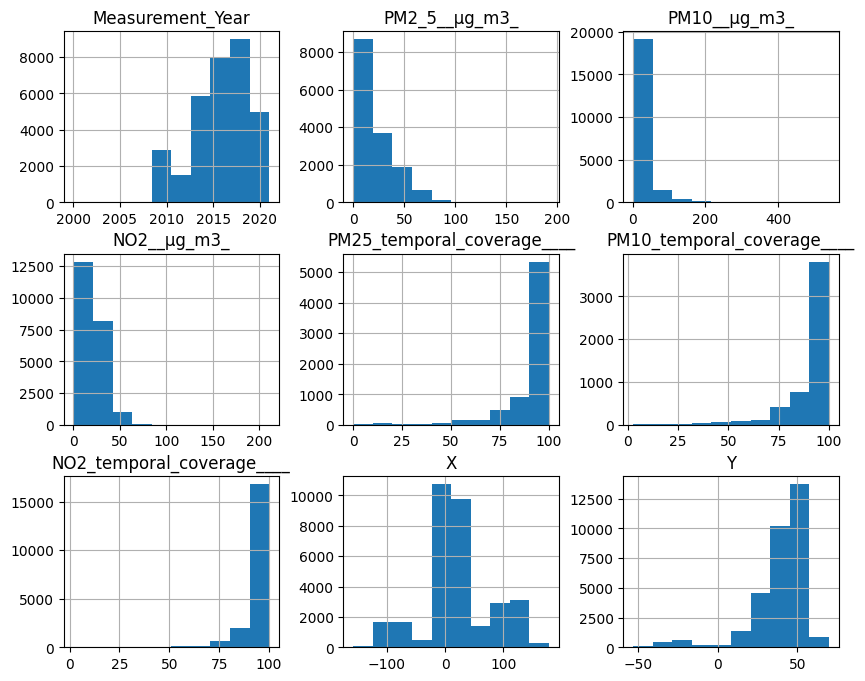

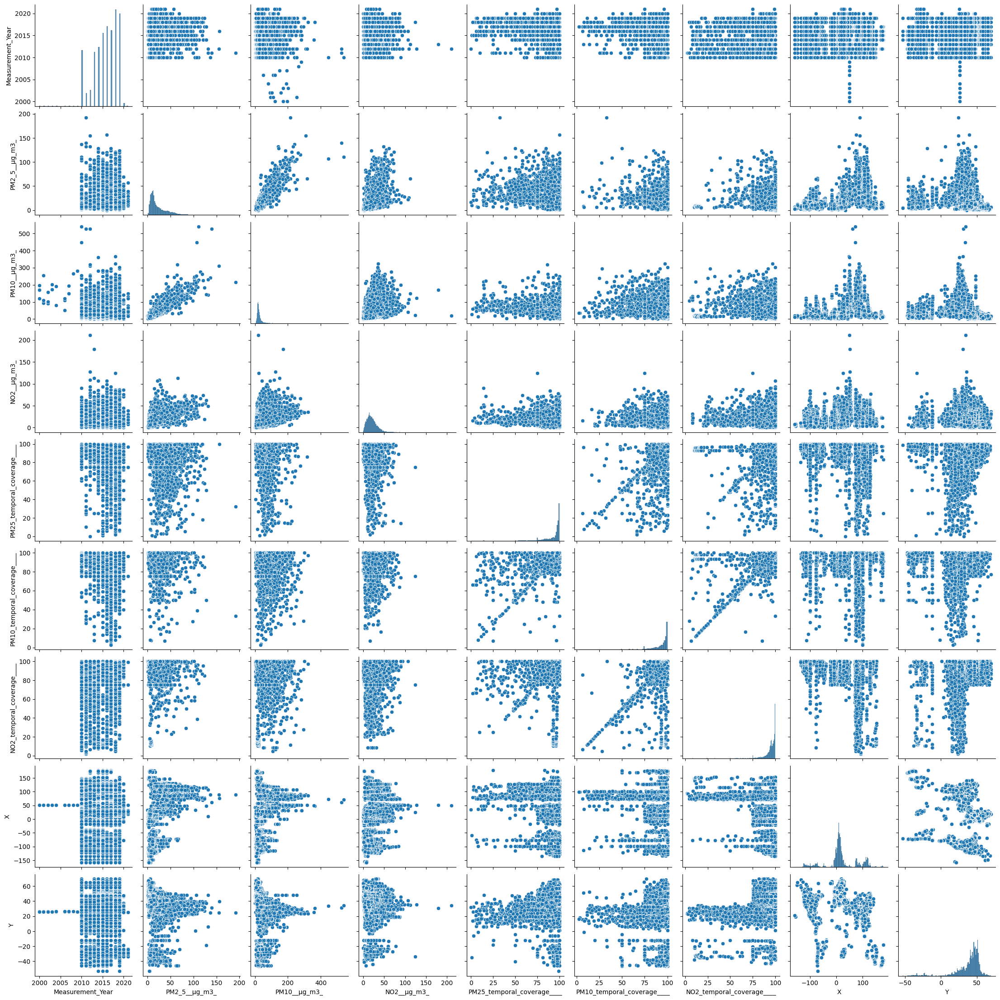

In [4]:
# Histogramy zmiennych numerycznych
db.hist(figsize=(10, 8))
plt.show()

# Wykresy punktowe dla zależności między zmiennymi
sns.pairplot(db)
plt.show()

W tym miejscu został przeprowadzony kolejny etap preprocessingu polegający na usunięciu rekordów, które dla żadego z analizowanych zanieczyszczeń nie posiadały danych. Decyzja ta została podjęta, gdyż estymacja wartości w tym przypadku byłaby bezcelowa, gdyż w żadnej z analiz nie byłyby to dane rzeczywiste, a co za tym idzie mogłyby się różnić od faktycznie zachodzących procesów. W ten sposób liczebność danych zmniejszyła się o 29 rekordów.

In [5]:
#Preprocessing - usunięcie wierszy, które nie mają wartości dla żadnej z analizowanych kolumn
df = db.dropna(subset=['PM2_5__μg_m3_', 'PM10__μg_m3_', 'NO2__μg_m3_','PM25_temporal_coverage____', 'PM10_temporal_coverage____', 'NO2_temporal_coverage____'], how='all')
print("Przed: ", db.shape[0], ", Po: ", df.shape[0])

Przed:  32191 , Po:  32162


Na tym etapie została pokazana kolejna wizualizacja - wykres korelacji między zmiennymi. Został on wyświetlony w tym miejscu, gdyż informacje, które z niego można odczytać mogły pomóc w zaplanowaniu dalszych kroków preprocessingu i na tym etapie najlepiej odzwierciedlały otrzymany zbiór danych Można zauważyć, że największa korelacja występuje pomiędzy wartością zanieczyszczenia PM2.5 oraz PM10. Dość wysokie wartości zostały również uzyskane dla stopnia pokrycia PM10 i NO2. W obu przypadkach mowa jest o korelacji dodatniej. Niezauważalna z kolei jest korelacja pomiędzy wartością zanieczyszczeń a stopniem ich pokrycia, gdyż opierają się one na niskich wartościach korelacji ujemnej.

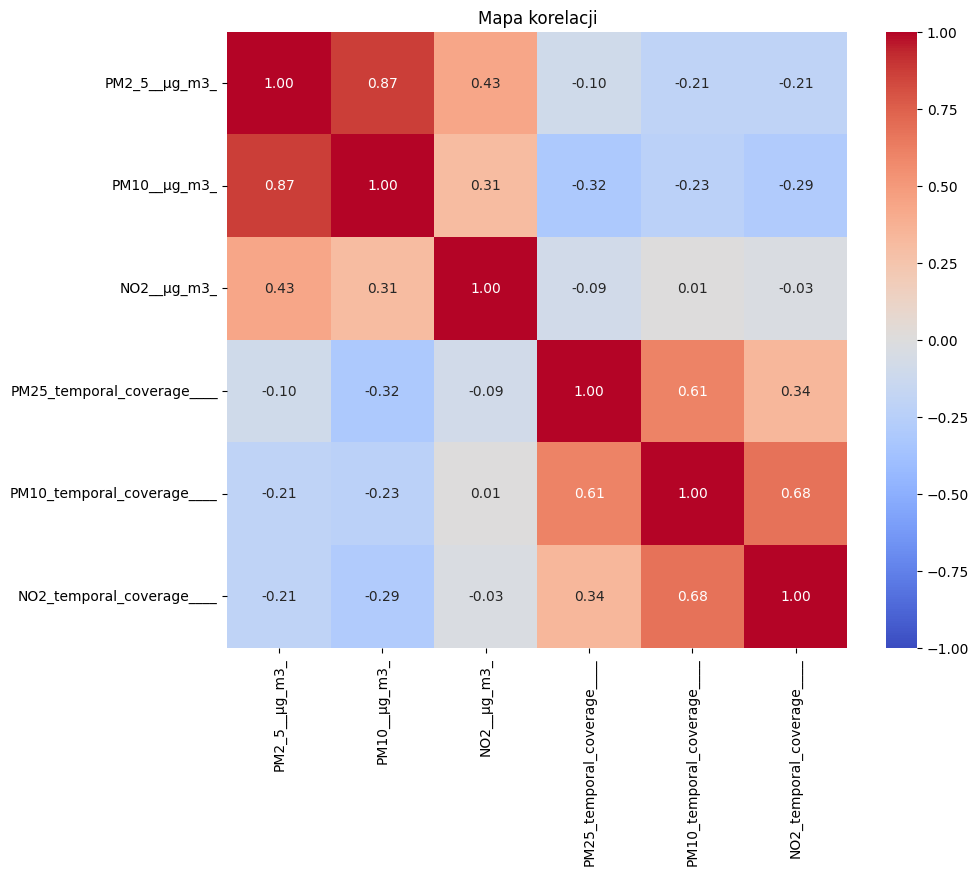

In [6]:
# Wybór wybranych kolumn
selected_columns = ['PM2_5__μg_m3_', 'PM10__μg_m3_', 'NO2__μg_m3_','PM25_temporal_coverage____', 'PM10_temporal_coverage____', 'NO2_temporal_coverage____']

# Obliczenie macierzy korelacji dla wybranych kolumn
corr_matrix = df[selected_columns].corr()


# Stworzenie heatmapy z mapą korelacji
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1, fmt=".2f")
plt.title('Mapa korelacji')
plt.show()

Teraz zostały podjęte dwa kroki pozwalające na estymacje części danych. Pierwszym z nich była interpolacja danych na podsawie wyników z innych lat dla badanej lokalizacji. Kolejnym krokiem było wykorzystanie wysokiej korelacji między PM2.5 i PM10 i próba estymowania ich wartości przy użyciu regresji liniowych. Pod każdą z metod została jeszcze raz wywołana funkcja omawiająca strukturę danych, aby można było w łatwy sposób zobaczyć ile danych udało się wyestymować.
Pomimo wykorzystania obu metod nie wszystkie wartości null udało się wyestymować. Została jednak podjęta decyzja o pozostawieniu ich, ze względu na ich dużą ilość w kodzie, co przy użyciu metody K najbliższych sąsiadów lub metod nie opartych na czynnikach przestrzennych mogłoby znacząco zmienić tendencje, które wykazywane są regionalne a tym zaprzeczył idei stojącej za wykonywaniem ten analizy.

In [ ]:
def interpolate_and_fill(df):
    # Grupujemy dane według lokalizacji
    grouped_by_location = df.groupby('City_or_Locality')
    # Iterujemy przez grupy lokalizacji
    for location, location_data in grouped_by_location:
        # Mediana wartości PM2.5 dla danej lokalizacji, ignorując brakujące wartości
        median_pm25 = location_data['PM2_5__μg_m3_'].median(skipna=True)
        # Mediana wartości PM10 dla danej lokalizacji, ignorując brakujące wartości
        median_pm10 = location_data['PM10__μg_m3_'].median(skipna=True)
        # Mediana wartości NO2 dla danej lokalizacji, ignorując brakujące wartości
        median_no2 = location_data['NO2__μg_m3_'].median(skipna=True)
        # Mediana wartości PM25 temporal coverage (%) dla danej lokalizacji, ignorując brakujące wartości
        median_pm25_temporal = location_data['PM25_temporal_coverage____'].median(skipna=True)
        # Mediana wartości PM10 temporal coverage (%) dla danej lokalizacji, ignorując brakujące wartości
        median_pm10_temporal = location_data['PM10_temporal_coverage____'].median(skipna=True)
        # Mediana wartości NO2 temporal coverage (%) dla danej lokalizacji, ignorując brakujące wartości
        median_no2_temporal = location_data['NO2_temporal_coverage____'].median(skipna=True)
        # Zastępujemy brakujące wartości PM2.5 medianą wartości dla danej lokalizacji
        df.loc[(df['City_or_Locality'] == location) & df['PM2_5__μg_m3_'].isnull(), 'PM2_5__μg_m3_'] = median_pm25
        # Zastępujemy brakujące wartości PM10 medianą wartości dla danej lokalizacji
        df.loc[(df['City_or_Locality'] == location) & df['PM10__μg_m3_'].isnull(), 'PM10__μg_m3_'] = median_pm10
        # Zastępujemy brakujące wartości NO2 medianą wartości dla danej lokalizacji
        df.loc[(df['City_or_Locality'] == location) & df['NO2__μg_m3_'].isnull(), 'NO2__μg_m3_'] = median_no2
        # Zastępujemy brakujące wartości PM25 temporal coverage (%) medianą wartości dla danej lokalizacji
        df.loc[(df['City_or_Locality'] == location) & df['PM25_temporal_coverage____'].isnull(), 'PM25_temporal_coverage____'] = median_pm25_temporal
        # Zastępujemy brakujące wartości PM10 temporal coverage (%) medianą wartości dla danej lokalizacji
        df.loc[(df['City_or_Locality'] == location) & df['PM10_temporal_coverage____'].isnull(), 'PM10_temporal_coverage____'] = median_pm10_temporal
        # Zastępujemy brakujące wartości NO2 temporal coverage (%) medianą wartości dla danej lokalizacji
        df.loc[(df['City_or_Locality'] == location) & df['NO2_temporal_coverage____'].isnull(), 'NO2_temporal_coverage____'] = median_no2_temporal
    return df

# Wywołujemy funkcję i aktualizujemy ramkę danych
df = interpolate_and_fill(df)
print(type(df))

C:\Users\asiap\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\lib\nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
C:\Users\asiap\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\lib\nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
C:\Users\asiap\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\lib\nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
C:\Users\asiap\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\lib\nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
C:\Users\asiap\AppData\Local\Programs\Python\Python312\Lib\site-packages\numpy\lib\nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
C:\Users\a

In [ ]:
# Sprawdzenie typów danych i brakujących wartości
print(df.info())

In [7]:
import warnings
import os

warnings.filterwarnings("ignore")
# Przekierowanie stdout i stderr na pustą funkcję
import sys
sys.stdout = open(os.devnull, 'w')
sys.stderr = open(os.devnull, 'w')

one_missing = df[df['PM2_5__μg_m3_'].isnull() ^ df['PM10__μg_m3_'].isnull()] 
one_missing

# Wydzielenie cechy (X) i zmiennej zależnej (y) dla regresji liniowej dla PM2_5__μg_m3_ i PM10__μg_m3_
none_missing = df.copy()
none_missing.dropna(subset=['PM2_5__μg_m3_', 'PM10__μg_m3_'], inplace=True)
X = none_missing[['PM2_5__μg_m3_']]
y = none_missing['PM10__μg_m3_']



# Utworzenie modelu regresji liniowej
model = LinearRegression()

# Trenowanie modelu na dostępnych danych
model.fit(X, y)

# Wyestymowanie brakujących wartości w 'PM10__μg_m3_' na podstawie 'PM2_5__μg_m3_'
missing_PM10_indices = one_missing[one_missing['PM10__μg_m3_'].isnull()].index
for idx in missing_PM10_indices:
    predicted_PM10 = model.predict([[one_missing.loc[idx, 'PM2_5__μg_m3_']]])
    one_missing.loc[idx, 'PM10__μg_m3_'] = predicted_PM10

none_missing = one_missing
none_missing.dropna(subset=['PM2_5__μg_m3_', 'PM10__μg_m3_'], inplace=True)
# Odwrotna operacja: estymacja brakujących wartości w 'PM2_5__μg_m3_' na podstawie 'PM10__μg_m3_'
X = none_missing[['PM10__μg_m3_']]
y = none_missing['PM2_5__μg_m3_']

# Utworzenie nowego modelu regresji liniowej
model = LinearRegression()

# Trenowanie modelu na dostępnych danych
model.fit(X, y)

# Wyestymowanie brakujących wartości w 'PM2_5__μg_m3_' na podstawie 'PM10__μg_m3_'
missing_PM2_5_indices = one_missing[one_missing['PM2_5__μg_m3_'].isnull()].index
for idx in missing_PM2_5_indices:
    predicted_PM2_5 = model.predict([[one_missing.loc[idx, 'PM10__μg_m3_']]])
    one_missing.loc[idx, 'PM2_5__μg_m3_'] = predicted_PM2_5

df.update(one_missing)




In [8]:
# Sprawdzenie typów danych i brakujących wartości
print(df.info())

UnicodeEncodeError: 'charmap' codec can't encode character '\u03bc' in position 525: character maps to <undefined>

## Kluczowe wizualizacje danych
### Mapa miast
Wizualizacja analizowanych danych została rozpoczęta od mapy świata, na którą w formie pinezek naniesione zostały wszystkie miasta. Każde z miast po przyciśnięciu wyświetla popup ze wszystkimi danymi dotyczącymi zanieczyszczenia ze wszystkich dostępnych dla niego lat. Mapa ma charakter demonstracyjny i ma na celu możliwość zapoznania się z dostępnymi danymi. Do celów tej wizualizacji zostały tu usunięte dodatkowo jeszcze dwa rekordy, nie posiadające współrzędnych. Dane pochodzą z miasta Giessem, które w tym przypadku było zapisane w języku narodowym. Decyzja o usunięciu ich zamiast zmiany nazwy wynikała tego, iż dla tych dwóch lat (2018 i 2019) istniały już dane pod nazwą pisaną przez 'ss', a wartości w taamtych rekordach były bardziej pokrewne pozostałym danym dla tego miasta oraz miały uzupełnione więcej kolumn danymi.

In [8]:
# Usunięcie wierszy, w których brakuje współrzędnych
df_cleaned = df.dropna(subset=['X', 'Y'])

# Zaokrąglenie liczby do dwóch miejsc po przecinku
def format_number(number):
    if isinstance(number, (int, float)):
        return round(number, 2)
    return number

# Utworzenie mapy
map = folium.Map(location=[0, 0], zoom_start=2)

# Grupowanie danych po lokalizacji (mieście)
grouped_by_location = df_cleaned.groupby('City_or_Locality')

# Dodanie markerów do mapy
marker_cluster = MarkerCluster().add_to(map)

# Iteracja po grupach lokalizacji
for location, location_data in grouped_by_location:
    # Nazwa miasta
    city_name = f"<b>{location}</b><br>"
    
    # Popup z pagonacją
    popup_content = f"<div style='max-height: 110px; overflow-y: auto;'>"
    for idx, row in location_data.iterrows():
        popup_content += f"Year: {row['Measurement_Year']}<br>"
        popup_content += f"PM2.5: {format_number(row['PM2_5__μg_m3_'])}<br>"
        popup_content += f"PM10: {format_number(row['PM10__μg_m3_'])}<br>"
        popup_content += f"NO2: {format_number(row['NO2__μg_m3_'])}<br>"
        popup_content += f"PM2.5 temporal coverage: {format_number(row['PM25_temporal_coverage____'])}<br>"
        popup_content += f"PM10 temporal coverage: {format_number(row['PM10_temporal_coverage____'])}<br>"
        popup_content += f"NO2 temporal coverage: {format_number(row['NO2_temporal_coverage____'])}<br>"
        popup_content += "<br>"
    popup_content += "</div>"
    
    # Połączenie nazwy miasta i treści popupu
    full_popup_content = city_name + popup_content
    
    # Dodanie markera do mapy dla danego miasta
    folium.Marker(
        location=[location_data.iloc[0]['Y'], location_data.iloc[0]['X']],  # Pobranie pierwszego rekordu w grupie jako lokalizacji
        popup=folium.Popup(full_popup_content, max_width=300, max_height=300),  # Użycie Popup z pagingiem
    ).add_to(marker_cluster)

# Wyświetlenie mapy
map

### Wykresy słupkowe
Kolejną wybraną metodą są interaktywne wykresy słupkowe. Pozwalają one wybrać analizowane zanieczyszenie i wyświelić średnie wartości dla danych lat. Wyświetlanie jest dostępne dla każdej z 3 grup:
 - jeśli wybrany został jedynie WHO Region, przedstawione dane są uśrednione dla całego regionu
 - jeśli wybrany został WHO Region oraz kraj, wtedy dane uśredniają wartości dla kraju
 - jeśli wszystkie dropdowny zostały uzupełnione, wtedy wartości wyświetlane sa dla wybranego miasta

Wykres ten umożliwia wizualne porównanie danych konkretnego zanieczyszczenia i pozwala na prostsze dostrzeżenie wykazywanych między latami trendów.

In [11]:
# Tworzenie interfejsu użytkownika za pomocą widgetów 
region_dropdown = widgets.Dropdown( 
    options=sorted(df['WHO_Region'].astype(str).unique()),  # Konwersja wartości na string przed sortowaniem 
    description='Region WHO:', 
    disabled=False, 
    layout={'width': '300px'}, 
) 

country_dropdown = widgets.Dropdown( 
    description='Kraj:', 
    disabled=False, 
    layout={'width': '300px'}, 
) 

city_dropdown = widgets.Dropdown( 
    description='Miasto:', 
    disabled=False, 
    layout={'width': '300px'}, 
) 

pollutant_dropdown = widgets.Dropdown( 
    options=['PM2_5__μg_m3_', 'PM10__μg_m3_', 'NO2__μg_m3_','PM25_temporal_coverage____', 'PM10_temporal_coverage____', 'NO2_temporal_coverage____'], 
    description='Zanieczyszczenie:', 
    disabled=False, 
    layout={'description_width': '200px', 'width': '300px'}, 
) 

# Funkcja do aktualizacji listy krajów w zależności od wybranego regionu 
def update_country_dropdown(region): 
    if region: 
        filtered_countries = sorted(df[df['WHO_Region'] == region]['WHO_Country_Name'].unique()) 
        country_dropdown.options = [''] + filtered_countries 
    else: 
        country_dropdown.options = [''] 

# Funkcja do aktualizacji listy miast w zależności od wybranego kraju 
def update_city_dropdown(country): 
    if country: 
        filtered_cities = sorted(df[(df['WHO_Country_Name'] == country)]['City_or_Locality'].unique()) 
        city_dropdown.options = [''] + filtered_cities 
    else: 
        city_dropdown.options = [''] 

# Funkcja do aktualizacji wykresów w zależności od wybranych wartości w dropdownach 
def update_plot(region, country, city, pollutant): 
    filtered_df = df.copy() 
    if region: 
        filtered_df = filtered_df[filtered_df['WHO_Region'] == region] 
    if country: 
        filtered_df = filtered_df[filtered_df['WHO_Country_Name'] == country] 
    if city: 
        filtered_df = filtered_df[filtered_df['City_or_Locality'] == city] 
     
    fig = make_subplots(rows=1, cols=1) 
     
    if city: 
        mean_values = filtered_df.groupby('Measurement_Year')[pollutant].mean() 
    elif country: 
        mean_values = filtered_df.groupby(['Measurement_Year', 'City_or_Locality'])[pollutant].mean().groupby('Measurement_Year').mean() 
    else: 
        mean_values = filtered_df.groupby(['Measurement_Year', 'WHO_Country_Name', 'City_or_Locality'])[pollutant].mean().groupby('Measurement_Year').mean() 
     
    fig.add_trace( 
        go.Bar(x=mean_values.index, y=mean_values.values, name='Value'), 
    ) 
     
    if city: 
        title = f"Average {pollutant} in {city}" 
    elif country: 
        title = f"Average {pollutant} in {country}" 
    else: 
        title = f"Average {pollutant} in {region}" 
     
    fig.update_layout( 
        title=title, 
        showlegend=True, 
        xaxis=dict(tickmode='linear'),  # Ograniczenie osi X do wartości całkowitych 
    ) 
    fig.show() 

# Funkcja do aktualizacji listy krajów w zależności od wybranego regionu
def update_country_dropdown(change):
    region = change['new']
    if region:
        filtered_countries = sorted(df[df['WHO_Region'] == region]['WHO_Country_Name'].unique())
        country_dropdown.options = [''] + filtered_countries
    else:
        country_dropdown.options = ['']

# Funkcja do aktualizacji listy miast w zależności od wybranego kraju
def update_city_dropdown(change):
    country = change['new']
    if country:
        filtered_cities = sorted(df[(df['WHO_Country_Name'] == country)]['City_or_Locality'].unique())
        city_dropdown.options = [''] + filtered_cities
    else:
        city_dropdown.options = ['']

# Wywołanie funkcji aktualizacji na początku
update_country_dropdown({'new': region_dropdown.value})
update_city_dropdown({'new': country_dropdown.value})

# Połączenie widgetów z funkcjami aktualizacji danych
interact(update_plot, region=region_dropdown, country=country_dropdown, city=city_dropdown, pollutant=pollutant_dropdown)

# Obserwacja zmian w rozwijanych listach i wywoływanie odpowiednich funkcji aktualizacji
region_dropdown.observe(update_country_dropdown, names='value')
country_dropdown.observe(update_city_dropdown, names='value')

interactive(children=(Dropdown(description='Region WHO:', layout=Layout(width='300px'), options=('African Regi…

## Mapa regionów
Kolejną formą wizualizacji jest interaktywna mapa dla regionów świata. Pozwala ona na wybranie zanieczyszczenia, dla którego poligony odpowiadające za kolejne WHO Regiony zostaną podświetlony na kolor zależny od wyliczonej dla nich średniej wartości zanieczyszenia. Mapa została wyposażona również w suwak pozwalająca się przesuwać pomiędzy kolejnymi latami. Dzięki niej można przeprowadzić analizę zmian czasowych dla regionów oraz różnić pomiędzy nimi. 

In [48]:
# Wczytanie pliku SHP z granicami regionów
regions = gpd.read_file('panstwa/regiony3.shp')
 

 
def generate_map(pollutant, year):
    # Wybieramy dane tylko dla wybranego roku
    df_year = df[df['Measurement_Year'] == year]
 
    # Wybieramy dane tylko dla wybranej kolumny zanieczyszczenia
    df_pollutant = df_year[['WHO_Region', 'Measurement_Year', pollutant]]

    # Obliczanie wartości minimalnej i maksymalnej średniej dla wybranego zanieczyszczenia
    min_avg_value = df.groupby('WHO_Region')[pollutant].mean().min()
    max_avg_value = df.groupby('WHO_Region')[pollutant].mean().max()
        
    if df_pollutant.empty:
        print(f'Brak danych dla roku {year}')
        return
 
    # Grupowanie danych po WHO_Region, obliczając średnią wartość zanieczyszczenia
    df_pollutant_avg = df_pollutant.groupby(['WHO_Region'])[pollutant].mean().reset_index()
 
    # Merge danych z granicami regionów
    regions_merged = regions.merge(df_pollutant_avg, left_on='WHO_REGION', right_on='WHO_Region', how='left')
 
    # Tworzenie mapy
    fig, ax = plt.subplots(figsize=(12, 8))
    regions_merged.plot(column=pollutant, cmap='OrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, missing_kwds={'color': 'lightgrey', 'label': 'Brak danych'}, legend_kwds={'shrink': 0.5}, vmin=min_avg_value, vmax=max_avg_value)
    ax.set_title(f'Średnie stężenie {pollutant} w różnych regionach na świecie w roku {year}', fontsize=16)
    ax.axis('off')
    plt.show()
 
# Tworzenie interaktywnych widżetów
pollutant_widget = widgets.Dropdown(
    options=['PM2_5__μg_m3_', 'PM10__μg_m3_', 'NO2__μg_m3_','PM25_temporal_coverage____', 'PM10_temporal_coverage____', 'NO2_temporal_coverage____'],
    value='PM2_5__μg_m3_',
    description='Zanieczyszczenie:',
    disabled=False,
)
 
years = sorted(df['Measurement_Year'].unique())
year_widget = widgets.IntSlider(
    min=min(years),
    max=max(years),
    step=1,
    value=min(years),
    description='Rok:',
    disabled=False,
    continuous_update=False
)
 
# Połączenie widżetów z funkcją generującą mapę
widgets.interact(generate_map, pollutant=pollutant_widget, year=year_widget)

interactive(children=(Dropdown(description='Zanieczyszczenie:', options=('PM2_5__μg_m3_', 'PM10__μg_m3_', 'NO2…

<function __main__.generate_map(pollutant, year)>

## Mapa krajów
Kolejna z map działa na tej samej zasadzie, co mapa powyżej, jednak ona skupia się na wartościach wyliczanych dla danego kraju. Dzięki trzem zaprezentowanym tu mapom jest możliwe przeprowadzenie podobnych analiz w zakresie trzech analizowanych grup oraz badanie zmian w kontekście światowym na kolejnych poziomach.

In [49]:
# Wczytanie pliku SHP z granicami krajów
world = gpd.read_file('panstwa/world-administrative-boundaries.shp')
 

 
def generate_map(pollutant, year):
    # Wybieramy dane tylko dla wybranego roku
    df_year = df[df['Measurement_Year'] == year]
 
    # Wybieramy dane tylko dla wybranej kolumny zanieczyszczenia
    df_pollutant = df_year[['ISO3', 'WHO_Country_Name', 'Measurement_Year', pollutant]]

    # Obliczanie wartości minimalnej i maksymalnej średniej dla wybranego zanieczyszczenia
    min_value = df.groupby('WHO_Country_Name')[pollutant].mean().min()
    max_value = df.groupby('WHO_Country_Name')[pollutant].mean().max()
    
    if df_pollutant.empty:
        print(f'Brak danych dla roku {year}')
        return
 
    # Grupowanie danych po ISO3 (kod kraju) i roku pomiaru, obliczając średnią wartość zanieczyszczenia
    df_pollutant_avg = df_pollutant.groupby(['ISO3', 'WHO_Country_Name'])[pollutant].mean().reset_index()
 
    # Merge danych z granicami krajów
    world_merged = world.merge(df_pollutant_avg, left_on='iso3', right_on='ISO3', how='left')
 
    # Tworzenie mapy
    fig, ax = plt.subplots(figsize=(12, 8))
    world_merged.plot(column=pollutant, cmap='OrRd', linewidth=0.8, ax=ax, edgecolor='0.8', legend=True, missing_kwds={'color': 'lightgrey', 'label': 'Brak danych'}, legend_kwds={'shrink': 0.5}, vmin=min_value, vmax=max_value)
    ax.set_title(f'Średnie stężenie {pollutant} w różnych krajach na świecie w roku {year}', fontsize=16)
    ax.axis('off')
    plt.show()
 
# Tworzenie interaktywnych widżetów
pollutant_widget = widgets.Dropdown(
    options=['PM2_5__μg_m3_', 'PM10__μg_m3_', 'NO2__μg_m3_','PM25_temporal_coverage____', 'PM10_temporal_coverage____', 'NO2_temporal_coverage____'],
    value='PM2_5__μg_m3_',
    description='Zanieczyszczenie:',
    disabled=False,
)
 
years = sorted(df['Measurement_Year'].unique())
year_widget = widgets.IntSlider(
    min=min(years),
    max=max(years),
    step=1,
    value=min(years),
    description='Rok:',
    disabled=False,
    continuous_update=False
)
 
# Połączenie widżetów z funkcją generującą mapę
widgets.interact(generate_map, pollutant=pollutant_widget, year=year_widget)

interactive(children=(Dropdown(description='Zanieczyszczenie:', options=('PM2_5__μg_m3_', 'PM10__μg_m3_', 'NO2…

<function __main__.generate_map(pollutant, year)>

## Wyniki analiz

Z zaobserowanych danych wynika, iż wraz z upływem czasu coraz więcej lokalizacji zaczęło interesować się jakością powietrza i zbierać wartości pomiarów. Zmienia się to jedynie na samym końcu zakresu danych (2020/2021). Taki stan rzeczy można jednak przypisać temu, że być może część krajów nie zdążyło podać wartości swoich pomiarów do WHO przed wydaniem tych danych. 
Można również zauważyć tendencje, iż najwyższe wartości zanieczyszczeń notowane są w krajach opartych na przemyśle oraz\lub wydobyciu surowców takich jak ropa czy węgiel. Dane dają jednak ciekawsze wyniki analizując je pod kątem krajów aniżeli regionów, gdyż w mniejszej skali można obserwować większą zmienność oraz zauważyć, jak wpływ nawet jednego kraju może wpływać na wzrost średniej dla całego regionu, co widać po zmianie skalowania na mapie regionu a na mapie krajów.
Trudniej jest wyciągnąć wnioski dotyczące analizy czasowych dla miast ze względu na dużą różnorodność. Biorąc pod uwagę tereny, na których występowało więcej danych można wydzielić dwa główne nurty: 
 - wartości poziomu zanieczyszczenia w kolejnych latach są wyznaczone na dość podobnym poziomie
 - wraz z upływem lat wartości poziomu zanieczyszczenia maleją

Druga ze wskazywanych tendencji jest częściej spotykana w miastach pochodzących z wysoko rozwiniętych regionów, gdzie panuje coraz większy nacisk na edukacje społeczeństwa pod kątem ochrony środowiska. Wnioski te zostały oparte na losowej próbie badawczej, dla otrzymania rzetelniejszych wyników należałoby pochylić się osobno dla każdego z 6904 miast lub dla konkretnego obszaru, wybranego do dalszych badań.

Posiadane dane wskazują, że najwyższe stężenia osiąga PM10.

Analizując z kolei dane dotyczące pokrycia, można zauważyć, że uzyskują one większe wartości dla terenów gęsto zaludnionych czy wysoko rozwiniętych. Może to być to spowodowane tym, że na tych terenach jest więcej czynników produkujących zanieczyszczenia - zarówno miejsca pracy, jak i samochody itd., jak również więcej osób, które mogą je generować o różnych porach. Do danych pokrycie należy jednak podchodzić z większą rezerwą, gdyż poziadają one więcej braków oraz część danych ma wartości, które nie wyglądają na rzetelne - np. na terenie Afryki większość danych jest uzupełniona stałą wartością całkowitą 75, a w środowisku trudno jest o taką powtarzalność bez zmian nawet w częściach 10.

## Dalsze kroki i użyteczność w Machine Learningu
Jako dalsze kroki można by przeprowadzić bardziej szczegółową analizę wybranego terenu zestawiając je z danymi z innych źródeł czy zawierającymi więcej informacji o analizowaym terenie. Można również poszukać danych dotyczących szerszego okresu czasu, gdyż obecnie najrzetelniejsze wyniki można było uzyskać między 2010 a 2018 rokiem, co jest zbyt krótkim okresem, żeby zauważyć długotrwałe tendencje i przemiany generowane przez człowieka. Analizując te dane pod kątem analizy terenu jako poligonu można byłoby również uwzględnić wielkość powierzchni, jaką reprezentuje dana wartość średnia i na podstawie stosunku wielkości obejmowanego terenu w grupie o szerszym zakresie i na tej podstawie wagować wartości danej średniej z pomiaru.
Jeśli chodzi o same dane, to ten konkretny zbiór nie w każdym regionie i nie dla każdej skali byłby dobrym wyborem do analizy przyszłych zanieczyszczeń ze względu na ilość braków, które zawiera, gdyż moga one spowodować nie wykrywanie istotnych tendencji wpływających na wielkość wartości. Brak równomiernego rozłożenia danych mógłby również skutkować wyciągnięciem pochopnych wniosków przy analizach większego obszaru, gdyż obecnie czasami jedno miasto mogłoby powodować wyniki osiągnięte dla całego regionu.
Skupiając się jednak na samych kolumnach zawartych w dostępnych danych są informacje, na których można by było oprzeć model starający się predyktować przyszłe wartości zanieczyszczeń, gdyż zawiera on informacje o 3 głównych związkach zawierających się w smogu oraz ich pokryciu terenu, co pozwoliło by zarówno określić czy wprowadzane działania skutkują poprawą jakości powietrza oraz próby szukania przyczyny powstawania smogu na podstawie pokrycia czasowego. Najlepiej dane te sprawdzałyby się dla krajów, gdyż, dzięki informacjom o miastach można byłoby wskazać, które obszary wpływają na wzrost zanieczyszczenia, jednak nie byłby to na tyle duży teren jak region, by dane znajdujące się blisko siebie mogły mieć znacząco odmienne wartości spowodowane innym poziomem gospodarczym między krajami czy ich sytuacją geopolityczną.